# NASA C-MAPSS dataset - EDA

Experimental Scenario

Data sets consists of multiple multivariate time series. Each data set is further divided into training and test subsets. Each time series is from a different engine i.e., the data can be considered to be from a fleet of engines of the same type. Each engine starts with different degrees of initial wear and manufacturing variation which is unknown to the user. This wear and variation is considered normal, i.e., it is not considered a fault condition. There are three operational settings that have a substantial effect on engine performance. These settings are also included in the data. The data is contaminated with sensor noise.

The engine is operating normally at the start of each time series, and develops a fault at some point during the series. In the training set, the fault grows in magnitude until system failure. In the test set, the time series ends some time prior to system failure. The objective of the competition is to predict the number of remaining operational cycles before failure in the test set, i.e., the number of operational cycles after the last cycle that the engine will continue to operate. Also provided a vector of true Remaining Useful Life (RUL) values for the test data.

*Copied from readme.txt*

In this project I will focus on the FD001 dataset, which is restricted to a single operation condition sea level.

## 1. Load data and first observations

In [1]:
import numpy as np
import pandas as pd

# Give names to the features based on the paper "A deep-learning based prognostic approach for predicting turbofan
# engine degradation and remaining useful life" by Samiha M. Elsherif et. al.
index_names = ['engine', 'cycle']
setting_names = ['throttle resolver angle', 'altitude', 'mach number']
sensor_names=[ "(Fan inlet total temperature) (◦R)",
"(LPC outlet total temperature) (◦R)",
"(HPC outlet total temperature) (◦R)",
"(LPT outlet total temperature) (◦R)",
"(Fan inlet Pressure) (psia)",
"(bypass-duct total pressure) (psia)",
"(HPC outlet total pressure) (psia)",
"(Physical fan speed) (rpm)",
"(Physical core speed) (rpm)",
"(Engine pressure ratio(P50/P2)",
"(HPC outlet Static pressure) (psia)",
"(Ratio of fuel flow to Ps30) (pps/psia)",
"(Corrected fan speed) (rpm)",
"(Corrected core speed) (rpm)",
"(Bypass Ratio) ",
"(Burner fuel-air ratio)",
"(Bleed Enthalpy)",
"(Demanded fan speed) (rpm)",
"(Demanded corrected fan speed) (rpm)",
"(High-pressure turbines coolant bleed) (lbm/s)",
"(Low-pressure turbines coolant bleed) (lbm/s)" ]
col_names = index_names + setting_names + sensor_names

df_train = pd.read_csv(r'..\data\raw\train_FD001.txt', sep='\s+', header=None, names=col_names)
df_test = pd.read_csv(r'..\data\raw\test_FD001.txt', sep='\s+', header=None, names=col_names)
df_test_RUL = pd.read_csv(r'..\data\raw\RUL_FD001.txt', sep='\s+', header=None, names=['RUL'])

In [2]:
df_train.head()

,engine,cycle,throttle resolver angle,altitude,mach number,(Fan inlet total temperature) (◦R),(LPC outlet total temperature) (◦R),(HPC outlet total temperature) (◦R),(LPT outlet total temperature) (◦R),(Fan inlet Pressure) (psia),...,(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Corrected core speed) (rpm),(Bypass Ratio),(Burner fuel-air ratio),(Bleed Enthalpy),(Demanded fan speed) (rpm),(Demanded corrected fan speed) (rpm),(High-pressure turbines coolant bleed) (lbm/s),(Low-pressure turbines coolant bleed) (lbm/s)
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [3]:
df_test.head()

,engine,cycle,throttle resolver angle,altitude,mach number,(Fan inlet total temperature) (◦R),(LPC outlet total temperature) (◦R),(HPC outlet total temperature) (◦R),(LPT outlet total temperature) (◦R),(Fan inlet Pressure) (psia),...,(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Corrected core speed) (rpm),(Bypass Ratio),(Burner fuel-air ratio),(Bleed Enthalpy),(Demanded fan speed) (rpm),(Demanded corrected fan speed) (rpm),(High-pressure turbines coolant bleed) (lbm/s),(Low-pressure turbines coolant bleed) (lbm/s)
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130


In [4]:
df_test_RUL.head()

,RUL
0,112
1,98
2,69
3,82
4,91


In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 26 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   engine                                          20631 non-null  int64  
 1   cycle                                           20631 non-null  int64  
 2   throttle resolver angle                         20631 non-null  float64
 3   altitude                                        20631 non-null  float64
 4   mach number                                     20631 non-null  float64
 5   (Fan inlet total temperature) (◦R)              20631 non-null  float64
 6   (LPC outlet total temperature) (◦R)             20631 non-null  float64
 7   (HPC outlet total temperature) (◦R)             20631 non-null  float64
 8   (LPT outlet total temperature) (◦R)             20631 non-null  float64
 9   (Fan inlet Pressure) (psia)            

In [6]:
df_train.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
engine,20631.0,51.506568,2.922763e+01,1.0000,26.0000,52.0000,77.0000,100.0000
cycle,20631.0,108.807862,6.888099e+01,1.0000,52.0000,104.0000,156.0000,362.0000
throttle resolver angle,20631.0,-0.000009,2.187313e-03,-0.0087,-0.0015,0.0000,0.0015,0.0087
altitude,20631.0,0.000002,2.930621e-04,-0.0006,-0.0002,0.0000,0.0003,0.0006
mach number,20631.0,100.000000,0.000000e+00,100.0000,100.0000,100.0000,100.0000,100.0000
(Fan inlet total temperature) (◦R),20631.0,518.670000,0.000000e+00,518.6700,518.6700,518.6700,518.6700,518.6700
(LPC outlet total temperature) (◦R),20631.0,642.680934,5.000533e-01,641.2100,642.3250,642.6400,643.0000,644.5300
(HPC outlet total temperature) (◦R),20631.0,1590.523119,6.131150e+00,1571.0400,1586.2600,1590.1000,1594.3800,1616.9100
(LPT outlet total temperature) (◦R),20631.0,1408.933782,9.000605e+00,1382.2500,1402.3600,1408.0400,1414.5550,1441.4900
(Fan inlet Pressure) (psia),20631.0,14.620000,5.329200e-15,14.6200,14.6200,14.6200,14.6200,14.6200


We can already see that the standard-deviation for some settings or sensors is almost zero or zero, so no change over time. Could be irrelevant parameters to predict RUL.

## 2. Plots

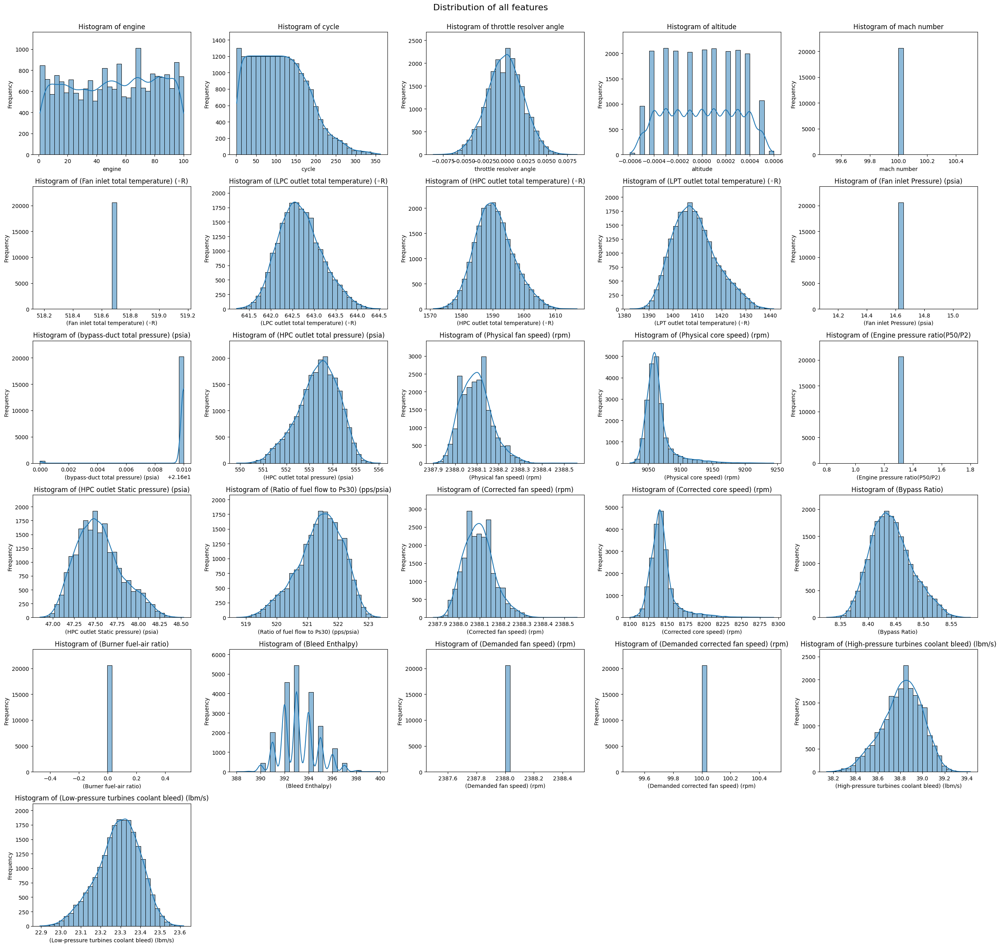

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import math


def plot_histogram_df_cols(df):
    num_cols = len(df.columns)
    num_cols_per_row = 5
    num_rows = math.ceil(num_cols / num_cols_per_row)

    fig, axes = plt.subplots(num_rows, num_cols_per_row, figsize=(num_cols_per_row * 5, num_rows * 4))
    axes = axes.flatten()

    for i, col in enumerate(df.columns):
        # get histogram data to scale y-axis correctly
        counts, bins = np.histogram(df[col], bins=30)
        max_count = counts.max()

        sns.histplot(df[col], bins=30, kde=True, ax=axes[i])
        axes[i].set_title(f"Histogram of {col}")
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')
        axes[i].set_ylim(0, max_count * 1.15)

    # delete remaining axes
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle("Distribution of all features", fontsize=16, y=1.0)
    plt.tight_layout()
    plt.show()

plot_histogram_df_cols(df_train)

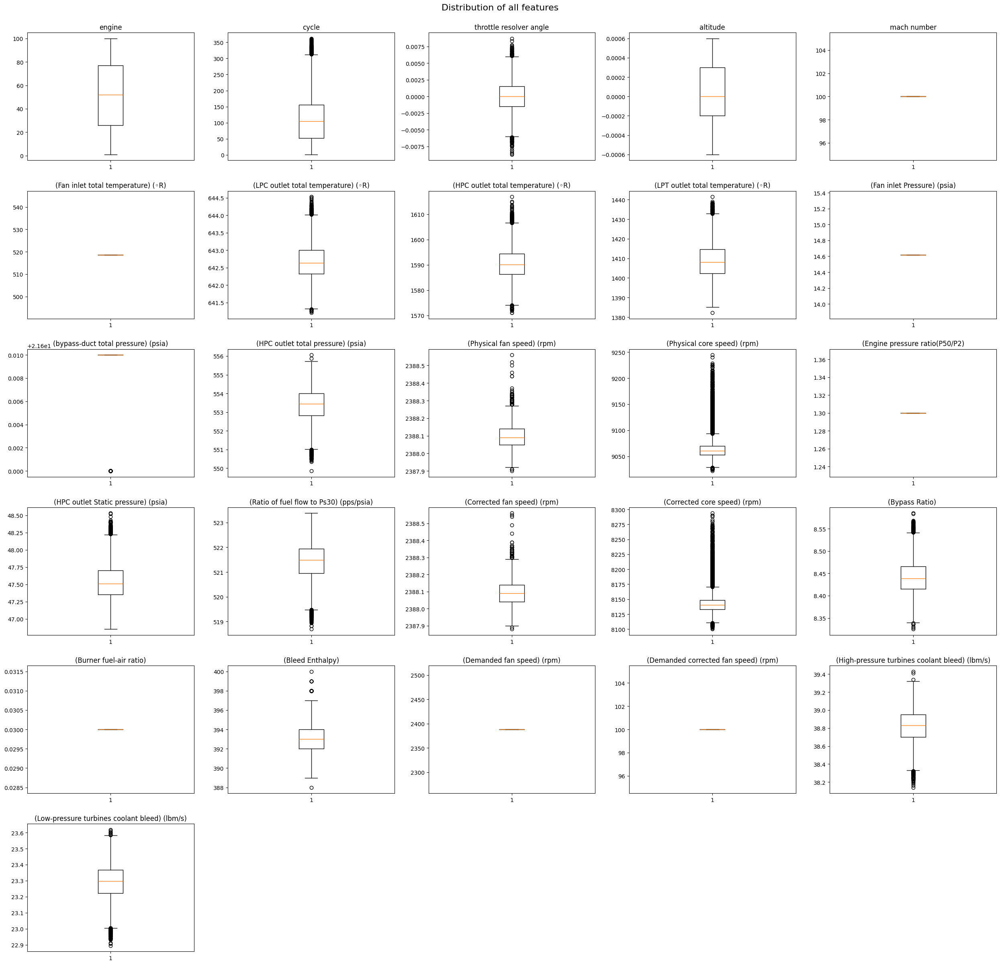

In [8]:
def plot_boxplot_df_cols(df):
    num_cols = len(df.columns)
    num_cols_per_row = 5
    num_rows = math.ceil(num_cols / num_cols_per_row)

    fig, axes = plt.subplots(num_rows, num_cols_per_row, figsize=(num_cols_per_row * 5, num_rows * 4))
    axes = axes.flatten()

    for i, col in enumerate(df.columns):
        axes[i].boxplot(df[col])
        axes[i].set_title(f"{col}")

    # delete remaining axes
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle("Distribution of all features", fontsize=16, y=1.0)
    plt.tight_layout()
    plt.show()

plot_boxplot_df_cols(df_train)

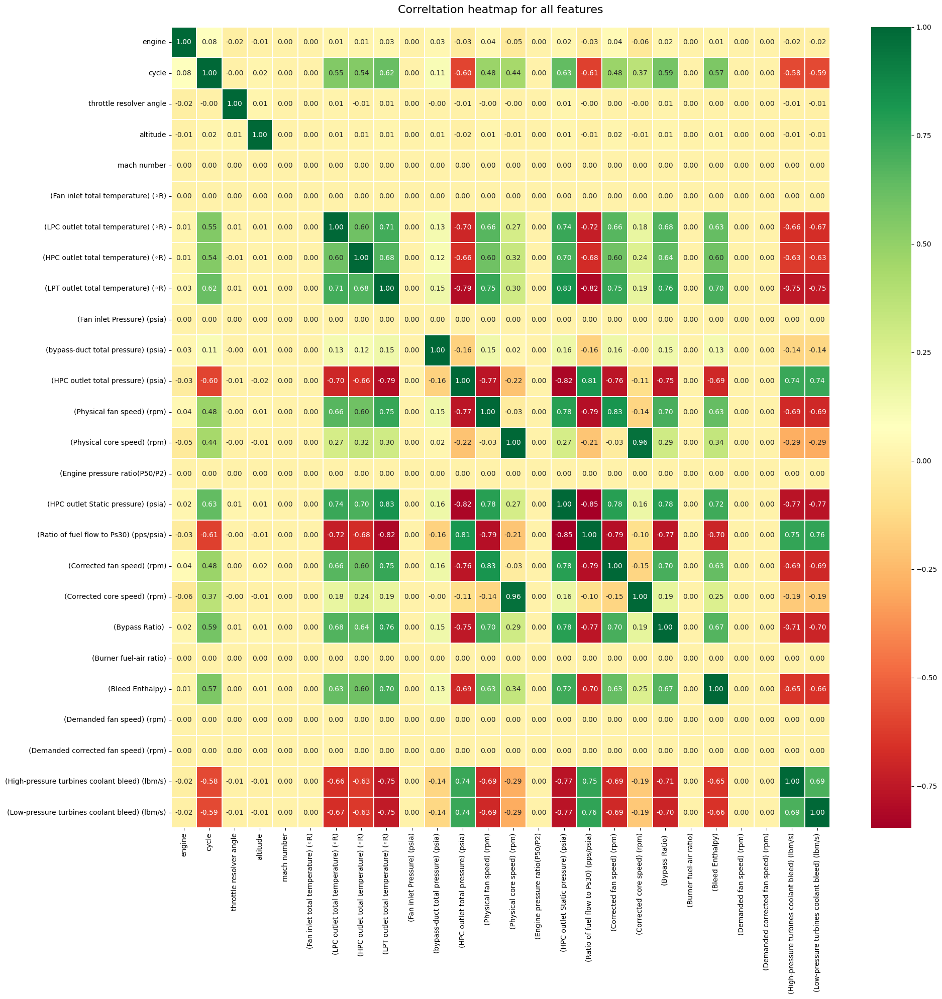

In [15]:
# correlation heatmap
plt.figure(figsize=(20,20))
sns.heatmap(df_train.corr().fillna(0), annot=True, fmt='.2f', cmap='RdYlGn', linewidths=0.2, yticklabels=True)
plt.title("Correltation heatmap for all features", fontsize=16, pad=20)
plt.tight_layout()
plt.show()

We can immediately see that for the operational features there is no correlation with the other featurs. Some sensor features like fan inlet total temperatur, fan inlet pressure, bypass-duct total pressure etc. do not have any correlation with other features.

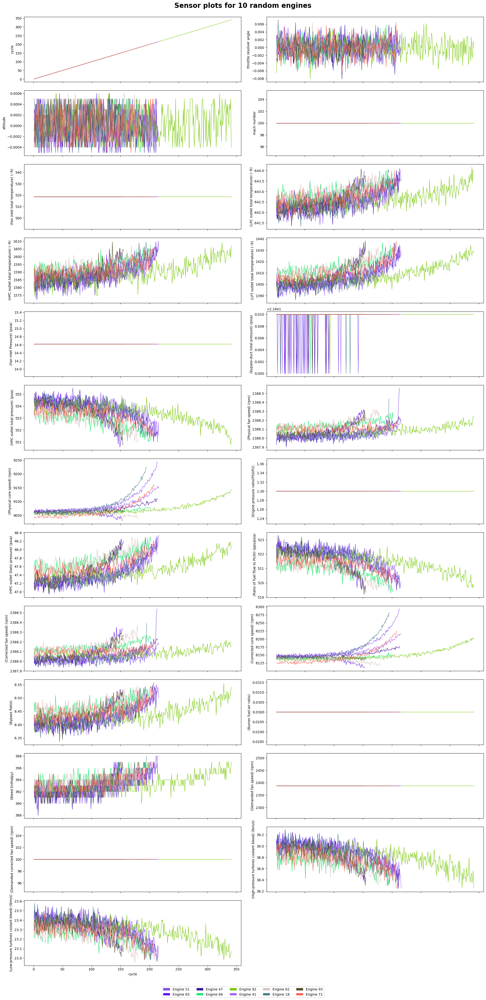

In [ ]:
import random
from matplotlib.patches import Patch

# plot the sensor outputs for 10 random sensors
num_cols = len(df_train.columns[1:])
num_cols_per_row = 2
num_rows = math.ceil(num_cols / num_cols_per_row)
plot_items = list(df_train.columns)[1:]
fig, ax = plt.subplots(num_rows, num_cols_per_row, figsize=(20,40), sharex=True)
ax = ax.flatten()

number_of_engines_to_plot = 10
engines = list(df_train['engine'].unique())
random_engines = random.sample(engines, k=number_of_engines_to_plot)
number_of_engines_to_plot = len(random_engines)

def generate_random_hex_colors(num_colors):
    colors = []
    for _ in range(num_colors):
        # Generate a random hex color code
        hex_color_code = '#%06x' % random.randint(0, 0xFFFFFF)
        colors.append(hex_color_code)
    return colors

random_colors = generate_random_hex_colors(number_of_engines_to_plot)

# Create custom legend handles
legend_elements = [Patch(facecolor=random_colors[i], label=f'Engine {random_engines[i]}') 
                   for i in range(number_of_engines_to_plot)]

for engine_idx, engine in enumerate(random_engines):
  for idx, item in enumerate(plot_items):
    f = sns.lineplot(data=df_train[df_train['engine'] == engine],
                     x='cycle', y=item, color=random_colors[engine_idx],
                     linewidth=1.0, ax=ax[idx])

for ax_idx in range(idx+1, len(ax)):
    fig.delaxes(ax[ax_idx])

fig.suptitle("Sensor plots for 10 random engines", fontsize=20, fontweight='bold', y=1.0)
fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, -0.02), 
           ncol=5, frameon=True, fontsize=10)
plt.tight_layout()
plt.show()

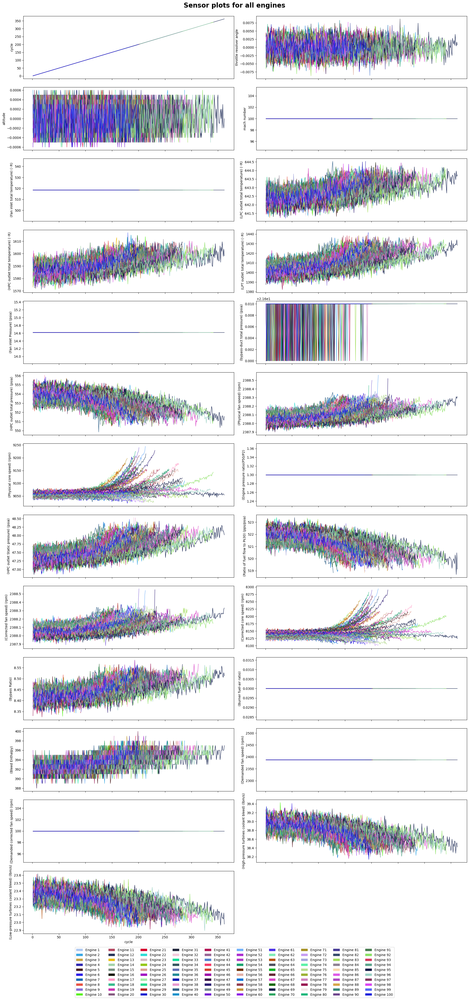

In [41]:
import random
from matplotlib.patches import Patch

# plot the sensor outputs for 10 random sensors
num_cols = len(df_train.columns[1:])
num_cols_per_row = 2
num_rows = math.ceil(num_cols / num_cols_per_row)
plot_items = list(df_train.columns)[1:]
fig, ax = plt.subplots(num_rows, num_cols_per_row, figsize=(20,40), sharex=True)
ax = ax.flatten()

engines = sorted(list(df_train['engine'].unique()))
number_of_engines_to_plot = len(engines)

def generate_random_hex_colors(num_colors):
    colors = []
    for _ in range(num_colors):
        # Generate a random hex color code
        hex_color_code = '#%06x' % random.randint(0, 0xFFFFFF)
        colors.append(hex_color_code)
    return colors

random_colors = generate_random_hex_colors(number_of_engines_to_plot)

# Create custom legend handles
legend_elements = [Patch(facecolor=random_colors[i], label=f'Engine {engines[i]}') 
                   for i in range(number_of_engines_to_plot)]

for engine_idx, engine in enumerate(engines):
  for idx, item in enumerate(plot_items):
    f = sns.lineplot(data=df_train[df_train['engine'] == engine],
                     x='cycle', y=item, color=random_colors[engine_idx],
                     linewidth=1.0, ax=ax[idx])

for ax_idx in range(idx+1, len(ax)):
    fig.delaxes(ax[ax_idx])

fig.suptitle("Sensor plots for all engines", fontsize=20, fontweight='bold', y=1.0)
fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, -0.055), 
           ncol=10, frameon=True, fontsize=10)
plt.tight_layout()
plt.show()